In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import tensorflow as tf
import sklearn as ss

In [16]:
import sys
print(sys.version)

3.12.4 | packaged by Anaconda, Inc. | (main, Jun 18 2024, 15:03:56) [MSC v.1929 64 bit (AMD64)]


In [17]:
print(np.__version__)
print(pd.__version__)
print(sns.__version__)
print(matplotlib.__version__)
print(tf.__version__)
print(ss.__version__)

1.26.4
2.2.2
0.13.2
3.8.4
2.17.0
1.4.2


In [2]:
data=pd.read_csv("Dataset/Crop_recommendation.csv")

In [3]:
data.head()

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


In [4]:
for i in data:
    print(f"{i}",data[i].max(),data[i].min())

N 140 0
P 145 5
K 205 5
temperature 43.67549305 8.825674745
humidity 99.98187601 14.25803981
ph 9.93509073 3.504752314
rainfall 298.5601175 20.21126747
label watermelon apple


In [5]:
data.shape

(2200, 8)

In [6]:
data["label"].nunique()

22

In [7]:
data["label"].unique()

array(['rice', 'maize', 'chickpea', 'kidneybeans', 'pigeonpeas',
       'mothbeans', 'mungbean', 'blackgram', 'lentil', 'pomegranate',
       'banana', 'mango', 'grapes', 'watermelon', 'muskmelon', 'apple',
       'orange', 'papaya', 'coconut', 'cotton', 'jute', 'coffee'],
      dtype=object)

array([[<Axes: title={'center': 'N'}>, <Axes: title={'center': 'P'}>,
        <Axes: title={'center': 'K'}>],
       [<Axes: title={'center': 'temperature'}>,
        <Axes: title={'center': 'humidity'}>,
        <Axes: title={'center': 'ph'}>],
       [<Axes: title={'center': 'rainfall'}>, <Axes: >, <Axes: >]],
      dtype=object)

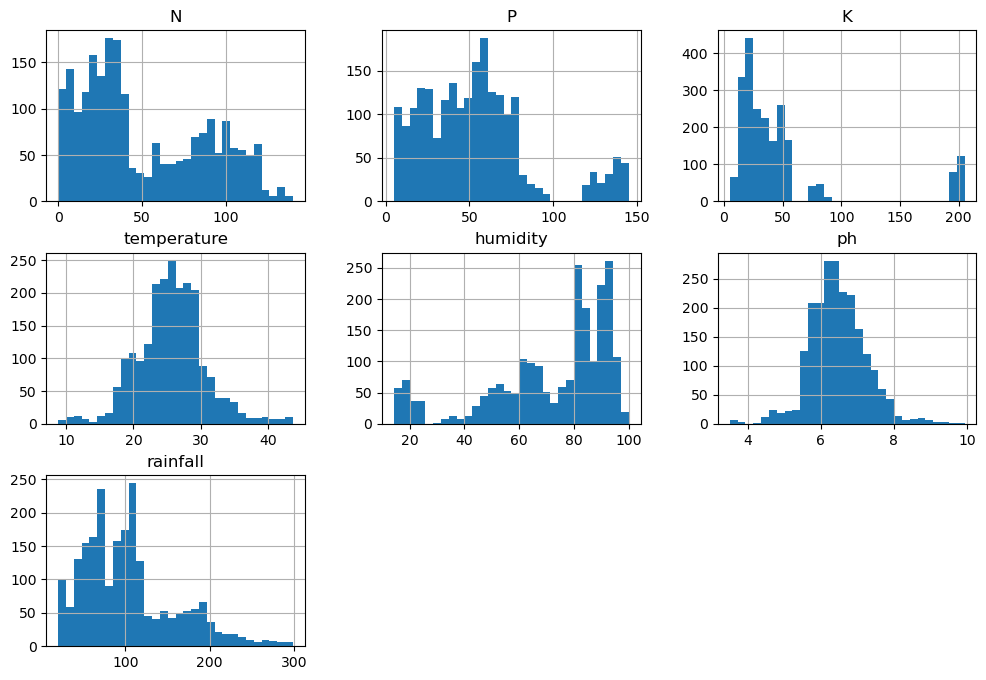

In [8]:
data.hist(bins=30,figsize=(12,8))

In [9]:
data.isnull().sum()

N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
label          0
dtype: int64

In [10]:
data.duplicated().sum()

0

array([[<Axes: title={'center': 'N'}>, <Axes: title={'center': 'P'}>,
        <Axes: title={'center': 'K'}>],
       [<Axes: title={'center': 'temperature'}>,
        <Axes: title={'center': 'humidity'}>,
        <Axes: title={'center': 'ph'}>],
       [<Axes: title={'center': 'rainfall'}>, <Axes: >, <Axes: >]],
      dtype=object)

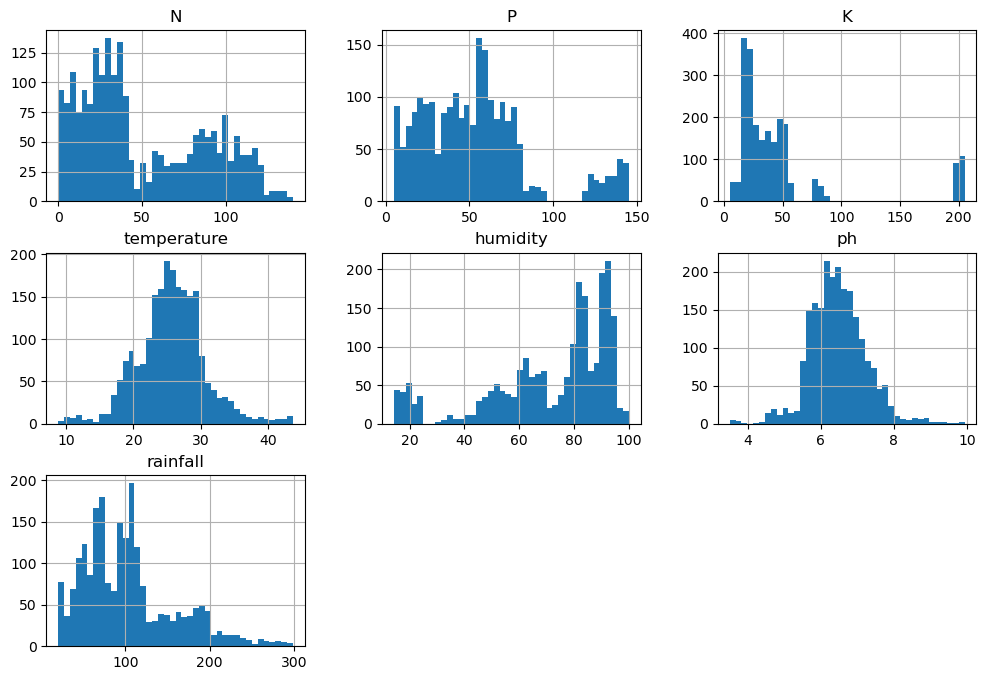

In [11]:
data.hist(figsize=(12,8),bins=40)

In [12]:
data.corr(numeric_only=True)

,N,P,K,temperature,humidity,ph,rainfall
N,1.000000,-0.231460,-0.140512,0.026504,0.190688,0.096683,0.059020
P,-0.231460,1.000000,0.736232,-0.127541,-0.118734,-0.138019,-0.063839
K,-0.140512,0.736232,1.000000,-0.160387,0.190859,-0.169503,-0.053461
temperature,0.026504,-0.127541,-0.160387,1.000000,0.205320,-0.017795,-0.030084
humidity,0.190688,-0.118734,0.190859,0.205320,1.000000,-0.008483,0.094423
ph,0.096683,-0.138019,-0.169503,-0.017795,-0.008483,1.000000,-0.109069
rainfall,0.059020,-0.063839,-0.053461,-0.030084,0.094423,-0.109069,1.000000


In [13]:
data.isnull().sum()

N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
label          0
dtype: int64

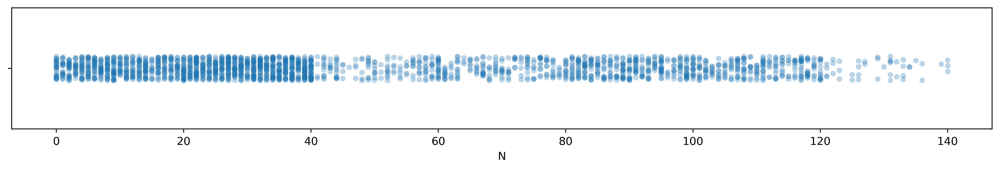

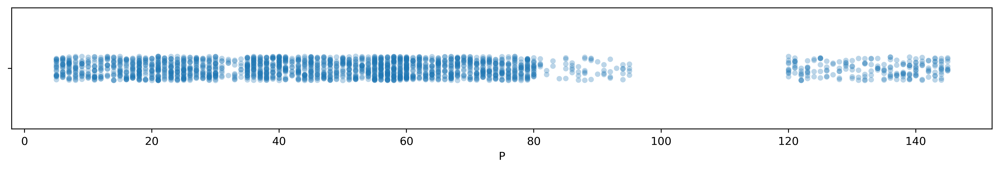

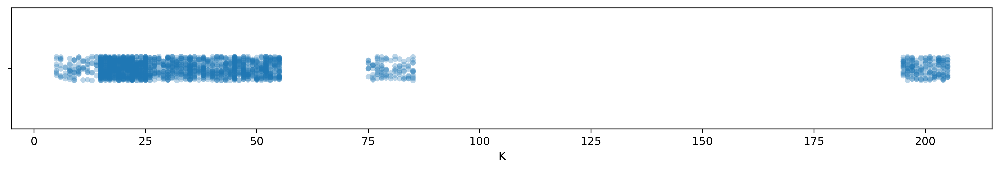

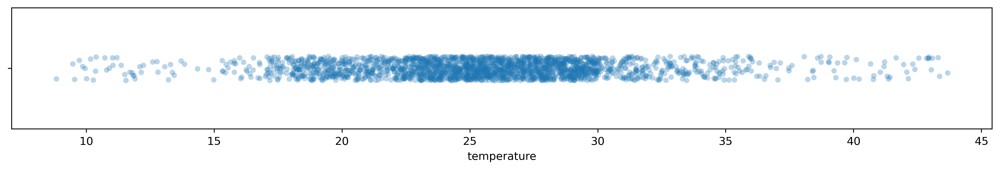

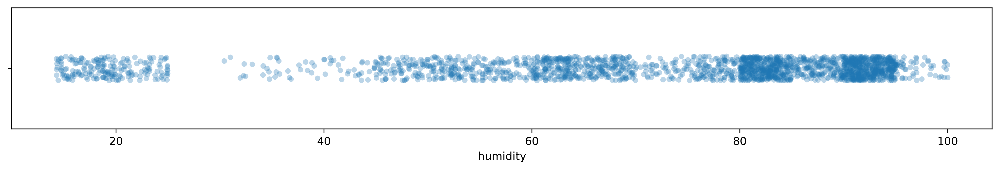

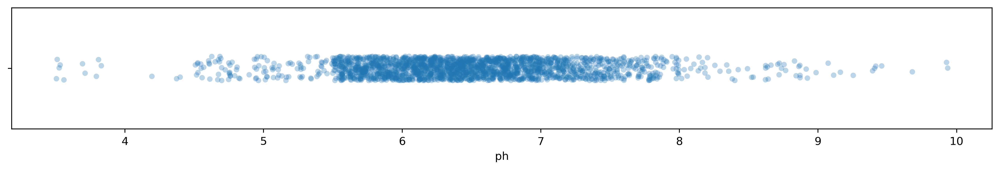

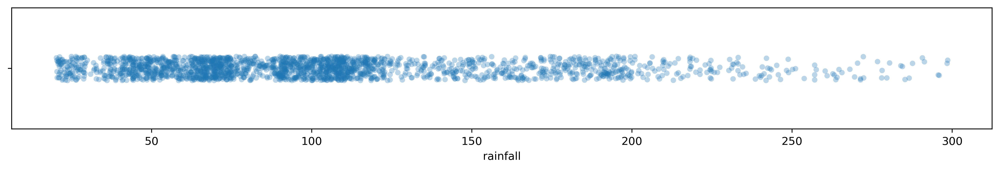

In [14]:
for i in data.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.stripplot(data=data,x=i,alpha=0.3)
    plt.show()

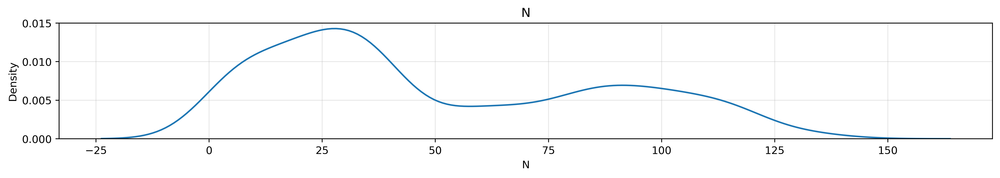

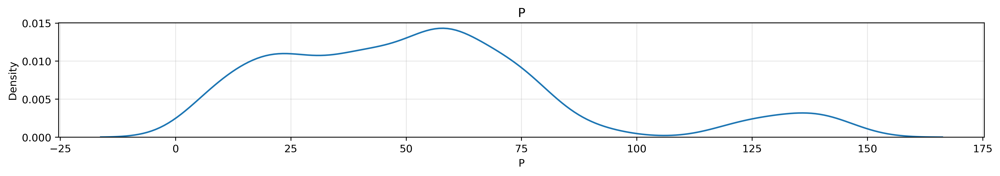

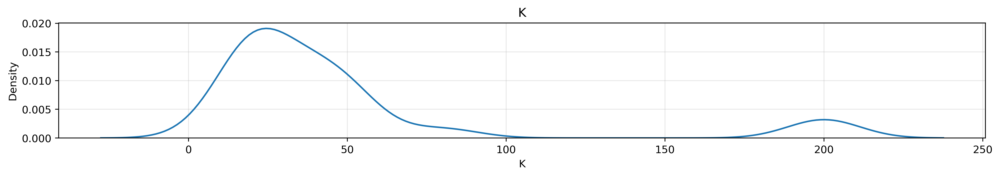

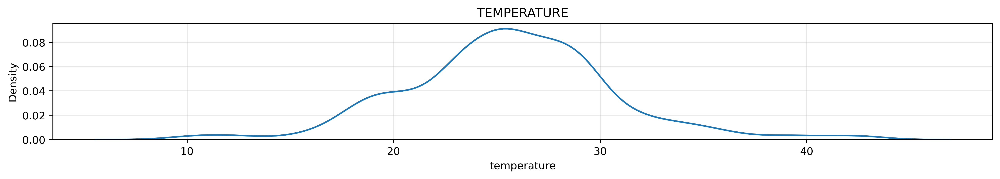

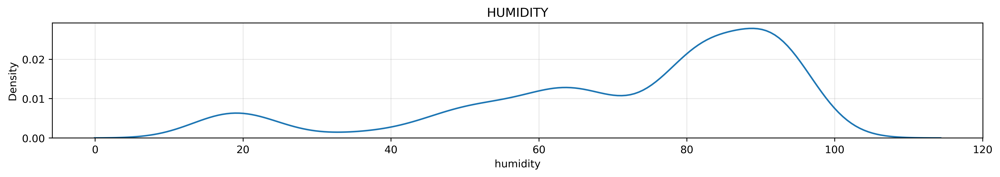

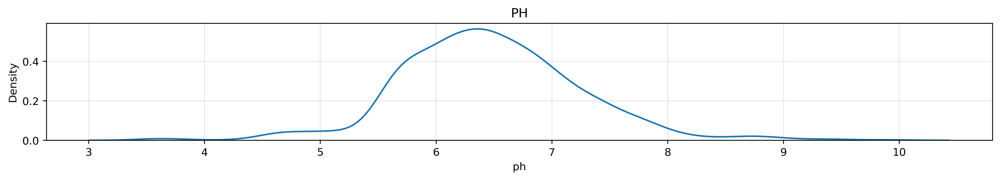

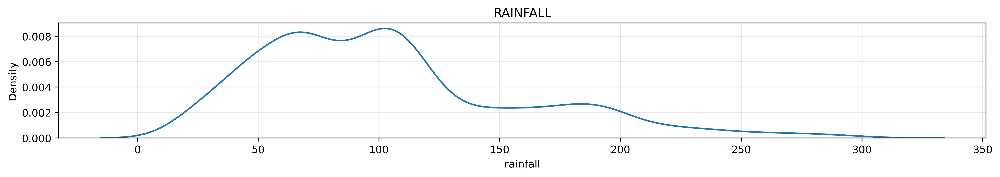

In [15]:
for i in data.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.kdeplot(data=data,x=i)
    plt.grid(alpha=0.3)
    plt.title(f"{i}".upper())
    plt.show()

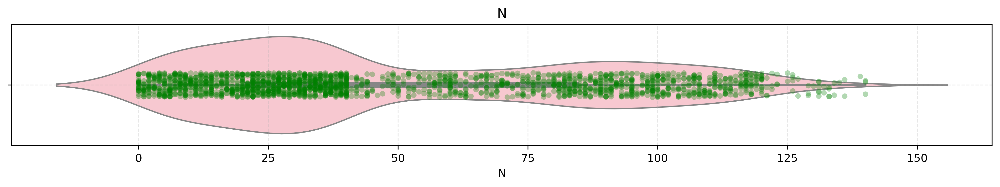

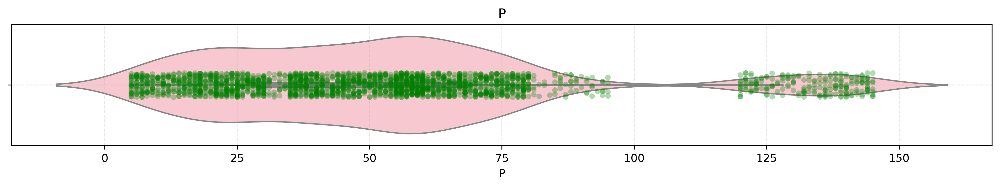

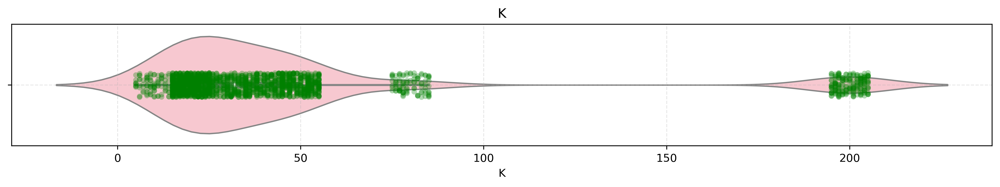

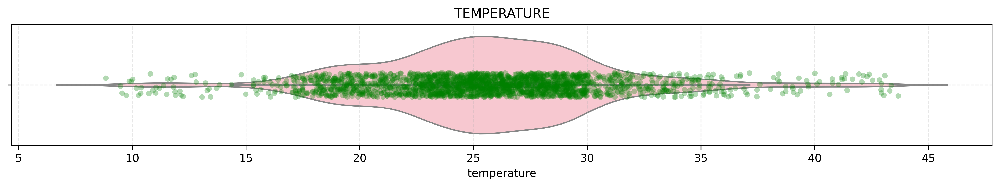

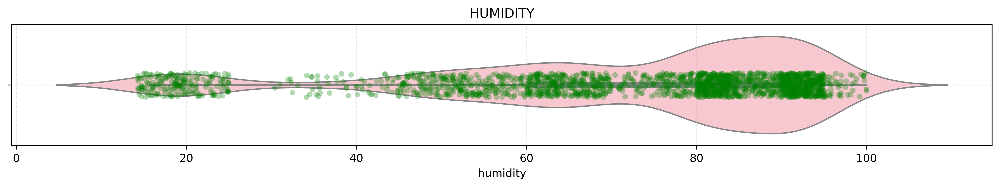

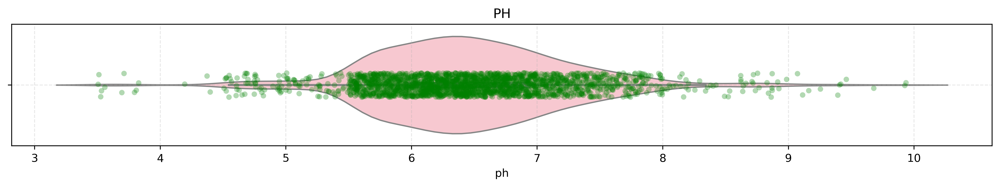

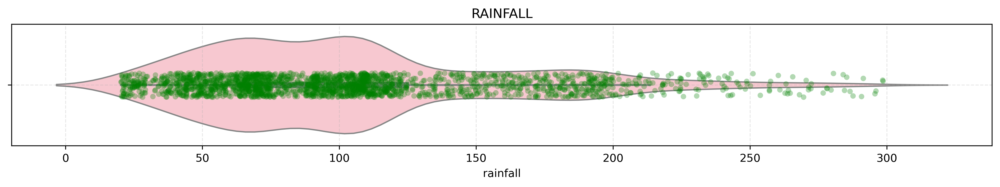

In [16]:
for i in data.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.violinplot(data=data,x=i,color="pink")
    sns.stripplot(data=data,x=i,color="green",alpha=0.3)
    plt.grid(ls='--',alpha=0.3)
    plt.title(f"{i}".upper())
    plt.show()

## WORKING WITH LABELS 

In [17]:
data["label"].value_counts()

label
rice           100
maize          100
jute           100
cotton         100
coconut        100
papaya         100
orange         100
apple          100
muskmelon      100
watermelon     100
grapes         100
mango          100
banana         100
pomegranate    100
lentil         100
blackgram      100
mungbean       100
mothbeans      100
pigeonpeas     100
kidneybeans    100
chickpea       100
coffee         100
Name: count, dtype: int64

# EXPLORING EACH LABEL AND FINDING OUT THE AVG VALUE WITH VISUALIZATION`

In [18]:
label=data.groupby(['label'])['ph'].mean()
label=label.reset_index()
label.columns=["label","PH"]

                                                                           N                                                                            
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of N---------------------------->20.8
Banana With Avergae Value Of N---------------------------->100.23
Blackgram With Avergae Value Of N---------------------------->40.02
Chickpea With Avergae Value Of N---------------------------->40.09
Coconut With Avergae Value Of N---------------------------->21.98
Coffee With Avergae Value Of N---------------------------->101.2
Co

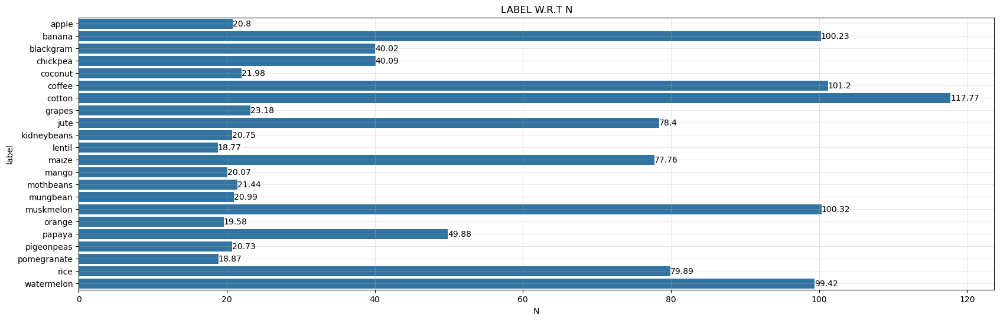

                                                                           P                                                                            
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of P---------------------------->134.22
Banana With Avergae Value Of P---------------------------->82.01
Blackgram With Avergae Value Of P---------------------------->67.47
Chickpea With Avergae Value Of P---------------------------->67.79
Coconut With Avergae Value Of P---------------------------->16.93
Coffee With Avergae Value Of P---------------------------->28.74
C

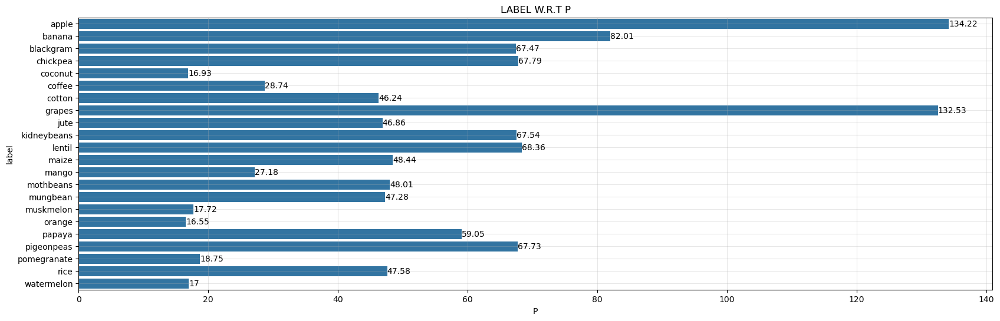

                                                                           K                                                                            
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of K---------------------------->199.89
Banana With Avergae Value Of K---------------------------->50.05
Blackgram With Avergae Value Of K---------------------------->19.24
Chickpea With Avergae Value Of K---------------------------->79.92
Coconut With Avergae Value Of K---------------------------->30.59
Coffee With Avergae Value Of K---------------------------->29.94
C

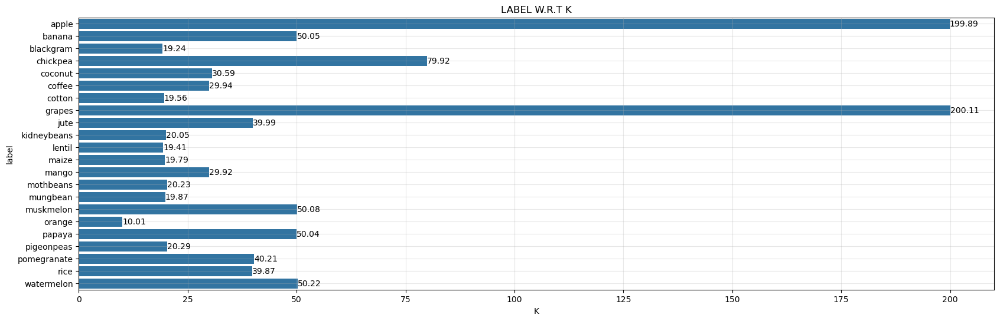

                                                                      TEMPERATURE                                                                       
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of TEMPERATURE---------------------------->22.6309424132
Banana With Avergae Value Of TEMPERATURE---------------------------->27.3767983057
Blackgram With Avergae Value Of TEMPERATURE---------------------------->29.9733396789
Chickpea With Avergae Value Of TEMPERATURE---------------------------->18.8728467519
Coconut With Avergae Value Of TEMPERATURE--------------------

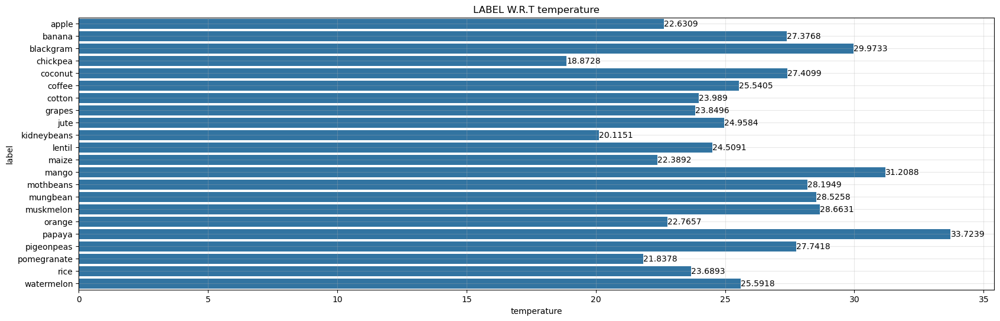

                                                                        HUMIDITY                                                                        
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of HUMIDITY---------------------------->92.3333828756
Banana With Avergae Value Of HUMIDITY---------------------------->80.35812258109999
Blackgram With Avergae Value Of HUMIDITY---------------------------->65.1184255887
Chickpea With Avergae Value Of HUMIDITY---------------------------->16.8604394237
Coconut With Avergae Value Of HUMIDITY---------------------------->94

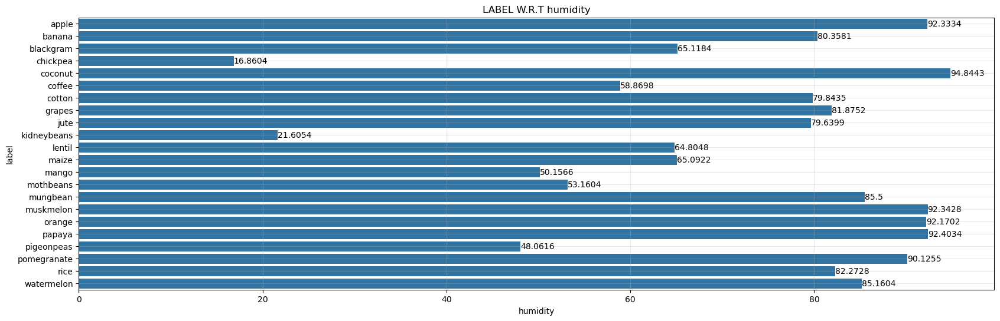

                                                                           PH                                                                           
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of PH---------------------------->5.929662931809999
Banana With Avergae Value Of PH---------------------------->5.98389318024
Blackgram With Avergae Value Of PH---------------------------->7.13395162948
Chickpea With Avergae Value Of PH---------------------------->7.33695662374
Coconut With Avergae Value Of PH---------------------------->5.97656212619
Coffee With Averga

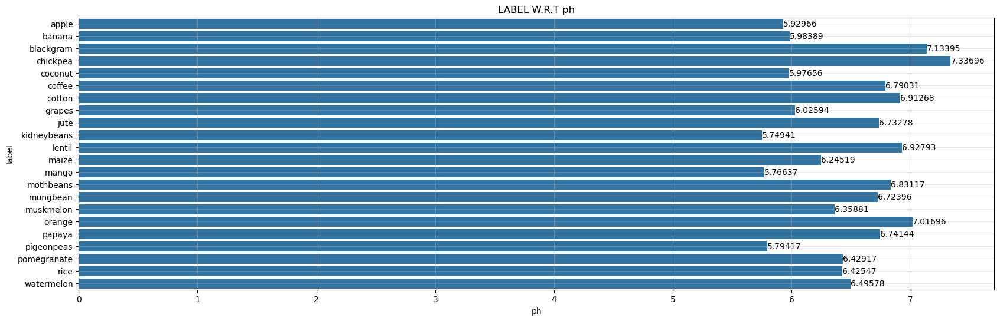

                                                                        RAINFALL                                                                        
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________________________________
Apple With Avergae Value Of RAINFALL---------------------------->112.654779275
Banana With Avergae Value Of RAINFALL---------------------------->104.6269804001
Blackgram With Avergae Value Of RAINFALL---------------------------->67.8841511832
Chickpea With Avergae Value Of RAINFALL---------------------------->80.0589772605
Coconut With Avergae Value Of RAINFALL---------------------------->175.6

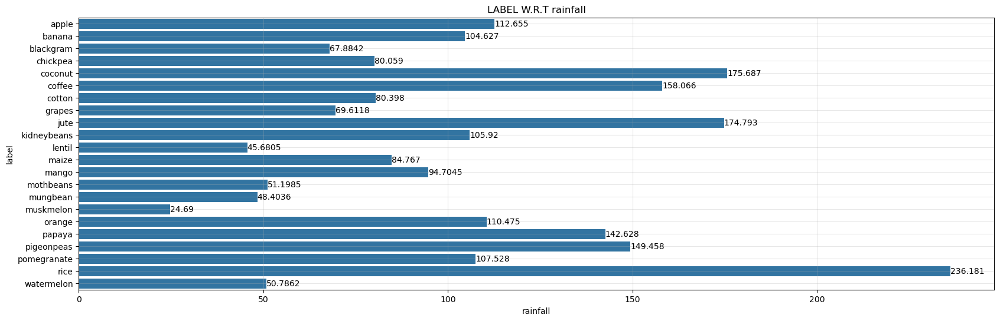

In [19]:
for i in data.select_dtypes(include=["number"]):
    label=data.groupby(['label'])[i].mean()
    label=label.reset_index()
    label.columns=["label",i]
    print(f"\033[1m{i}\033[0m".center(160).upper())
    print("_"*149)
    print("_"*149)
    print("_"*149)
    for index, row in label.iterrows():
        print(f"{row['label'].capitalize()} With Avergae Value Of {i.upper()}---------------------------->{row[i]}")
    plt.figure(figsize=(20,6))
    ax=sns.barplot(data=label,y=label["label"],x=label[i])
    print("_"*149)
    print("_"*149)
    print("_"*149)
    plt.title(f"LABEL W.R.T {i}")
    for i in ax.containers:
        ax.bar_label(i,)
    plt.grid(alpha=0.3)
    plt.show()

### APPLE

In [20]:
apple=data[data["label"]=='apple']

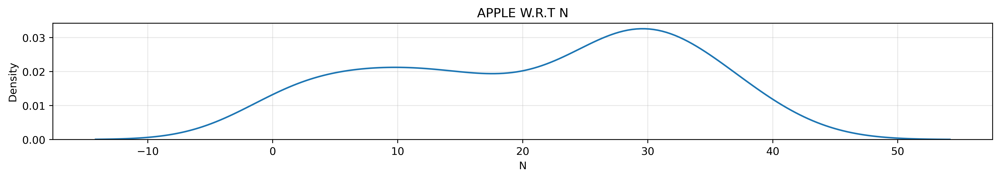

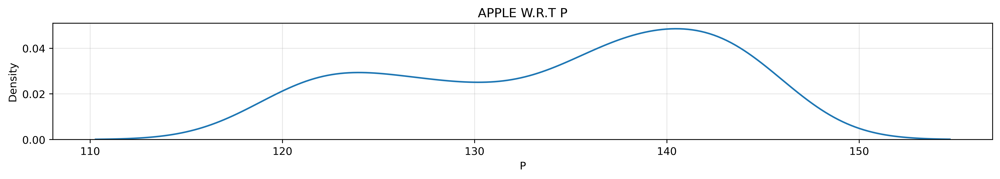

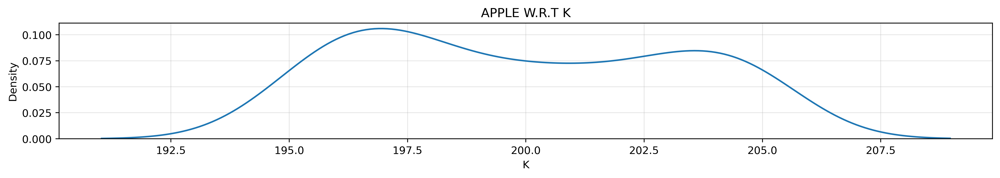

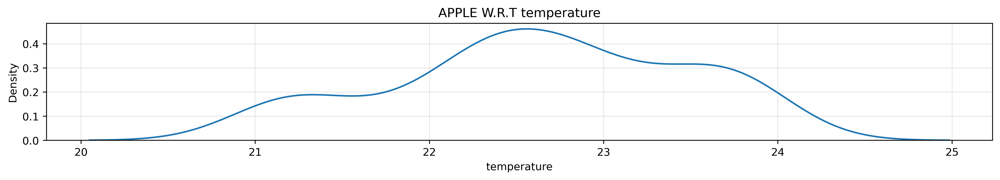

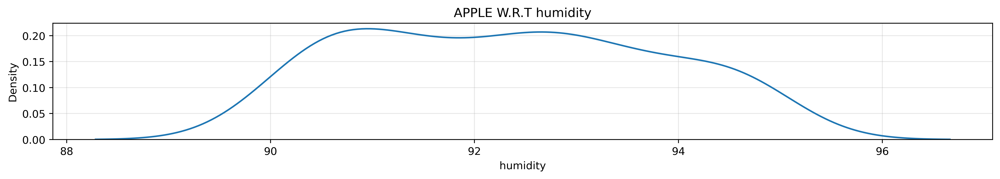

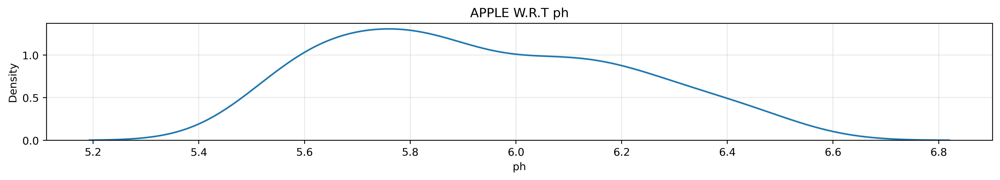

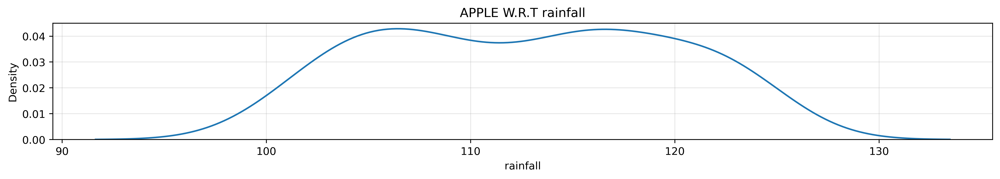

In [21]:
for i in apple.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.kdeplot(data=apple,x=i)
    plt.grid(alpha=0.3)
    plt.title(f"APPLE W.R.T {i}")
    plt.show()

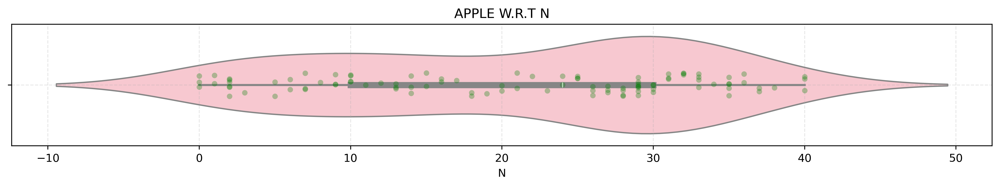

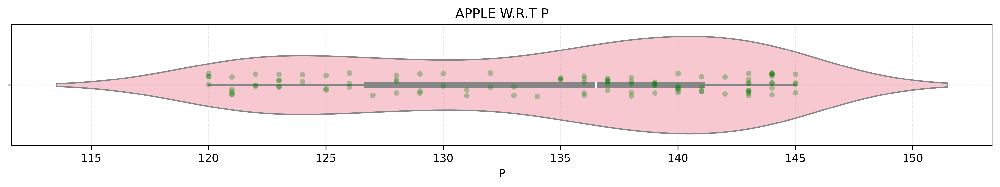

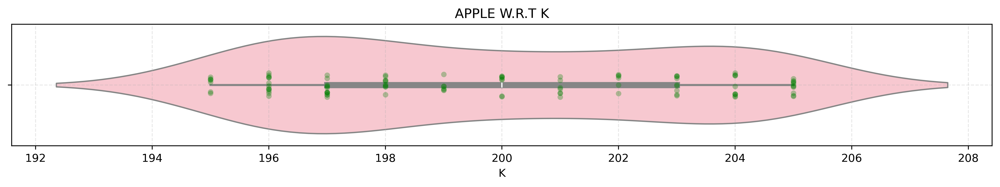

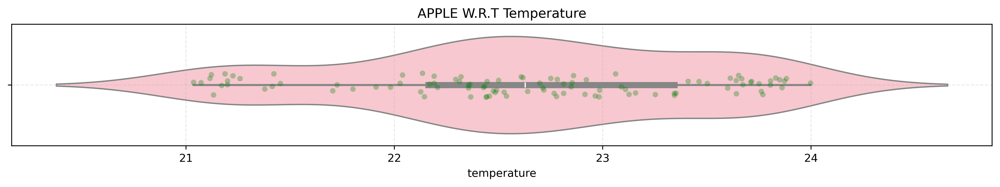

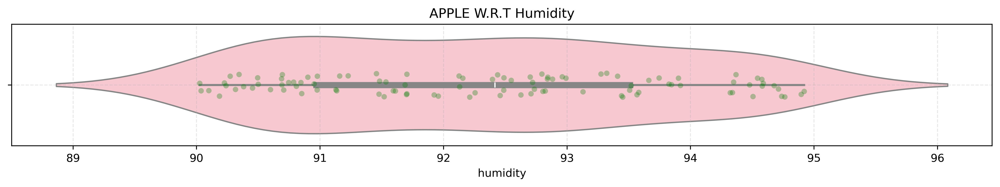

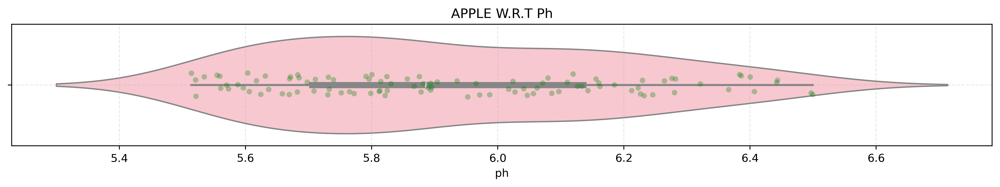

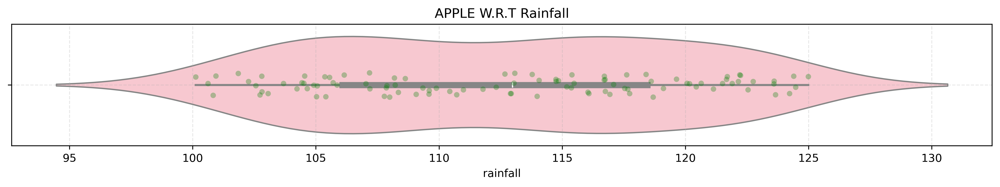

In [22]:
for i in apple.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.violinplot(data=apple,x=i,color="pink")
    sns.stripplot(data=apple,x=i,color="green",alpha=0.3)
    plt.grid(ls='--',alpha=0.3)
    plt.title(f"APPLE W.R.T {i.capitalize()}")
    plt.show()

### BANANA

In [23]:
BANANA=data[data["label"]=='banana']

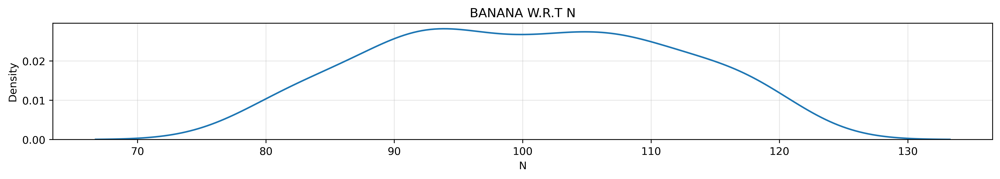

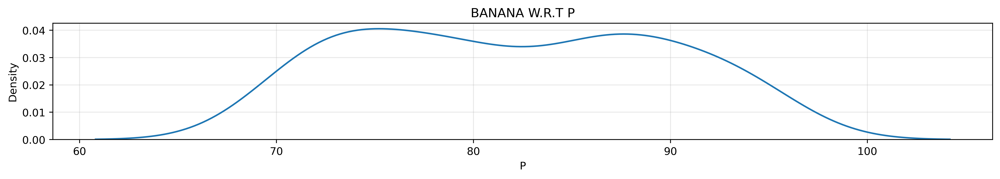

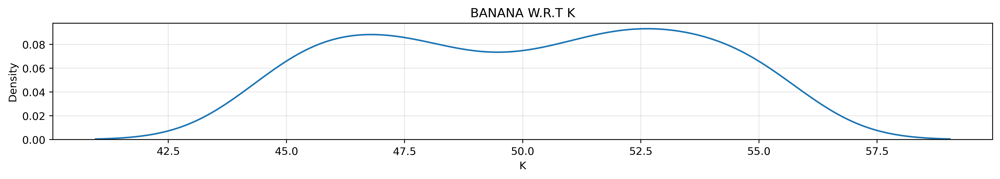

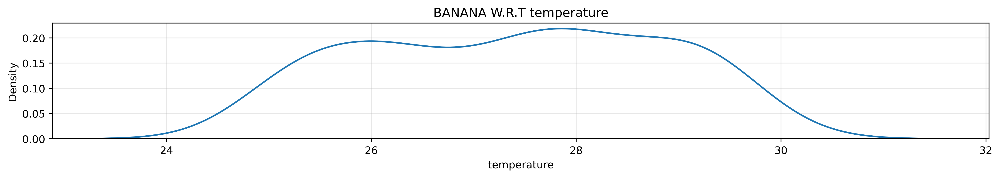

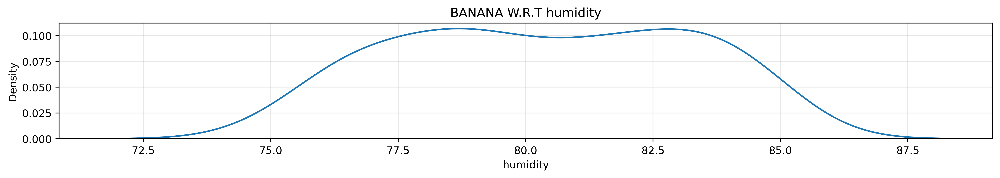

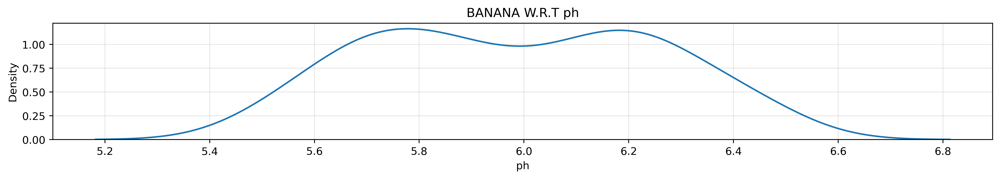

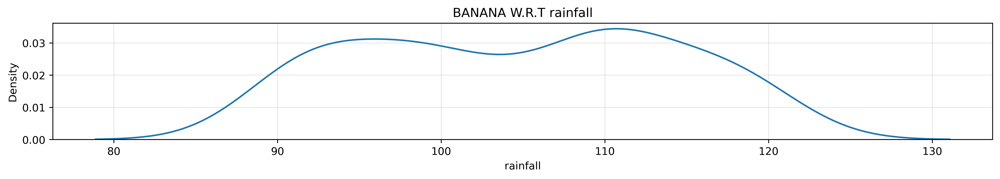

In [24]:
for i in BANANA.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.kdeplot(data=BANANA,x=i)
    plt.grid(alpha=0.3)
    plt.title(f"BANANA W.R.T {i}")
    plt.show()

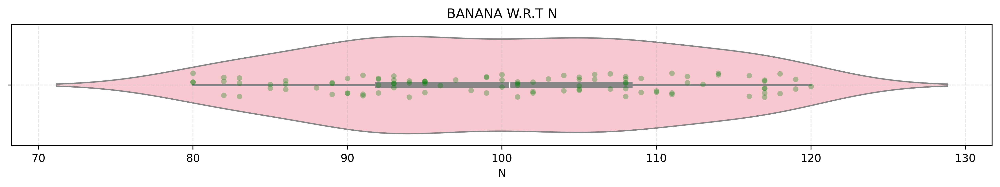

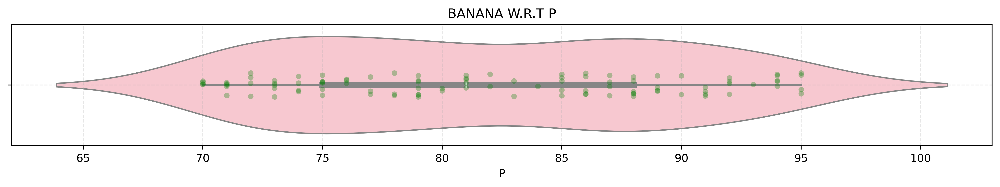

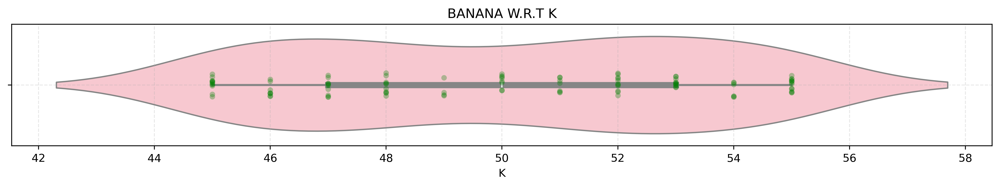

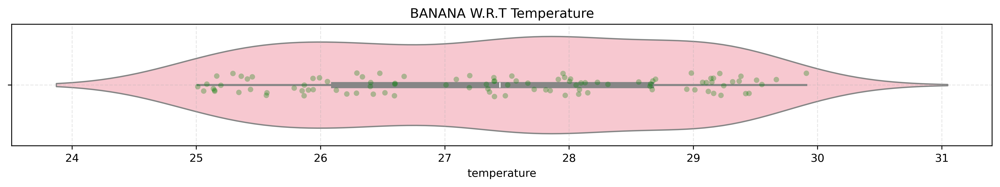

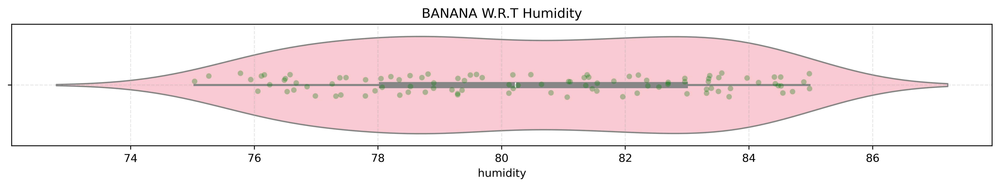

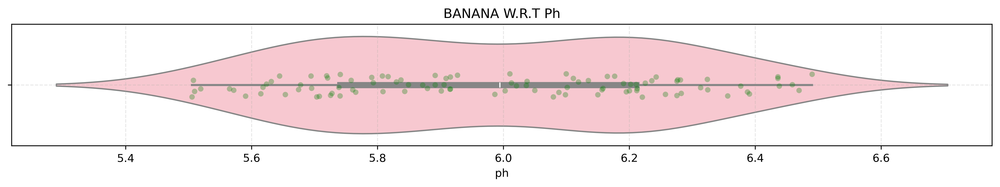

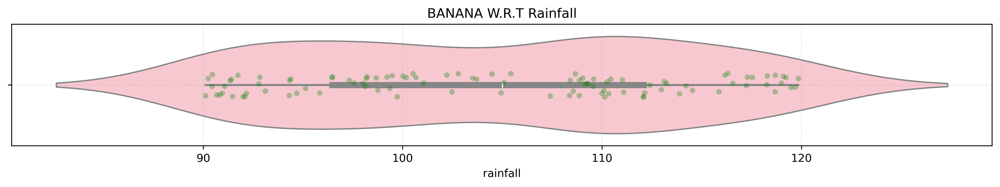

In [25]:
for i in BANANA.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.violinplot(data=BANANA,x=i,color="pink")
    sns.stripplot(data=BANANA,x=i,color="green",alpha=0.3)
    plt.grid(ls='--',alpha=0.3)
    plt.title(f"BANANA W.R.T {i.capitalize()}")
    plt.show()

### BLACKGRAM

In [26]:
BLACKGRAM=data[data["label"]=='blackgram']

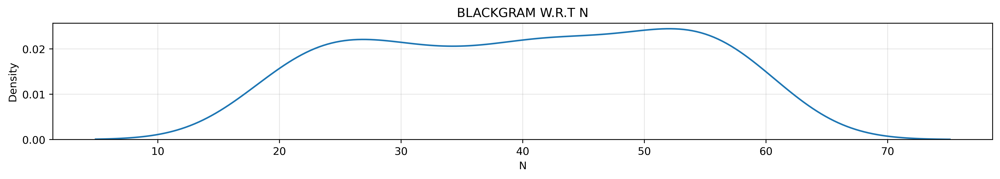

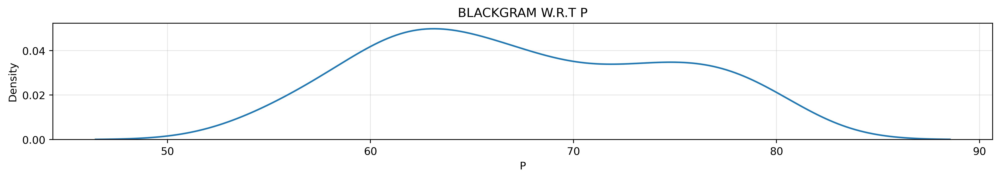

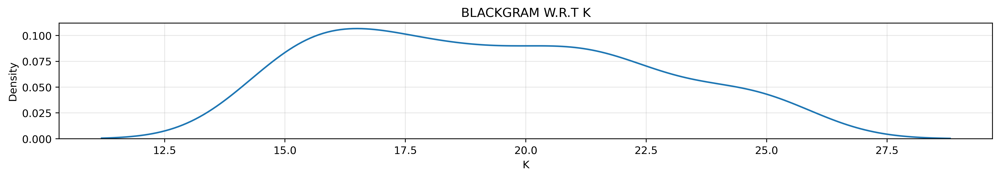

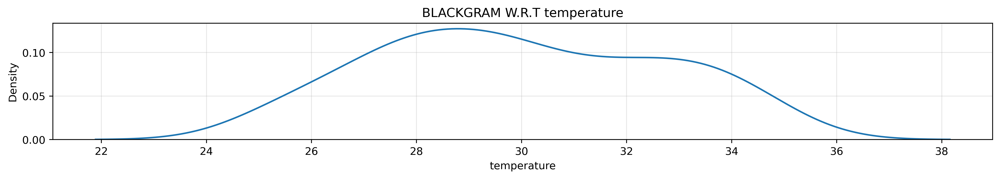

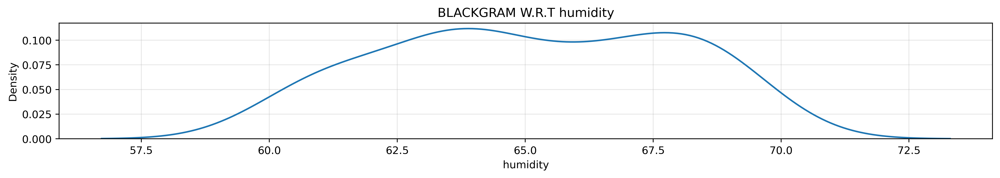

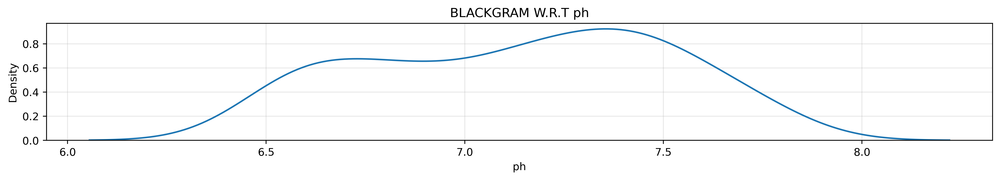

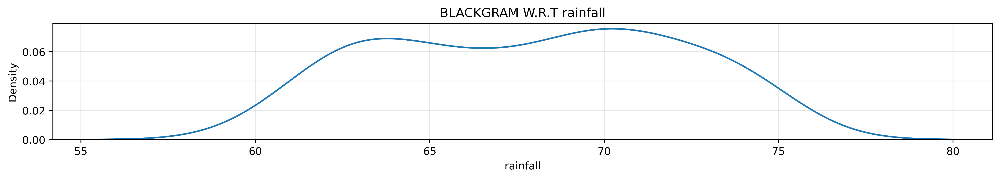

In [27]:
for i in BLACKGRAM.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.kdeplot(data=BLACKGRAM,x=i)
    plt.grid(alpha=0.3)
    plt.title(f"BLACKGRAM W.R.T {i}")
    plt.show()

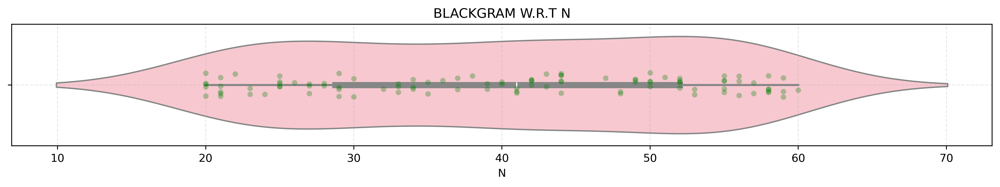

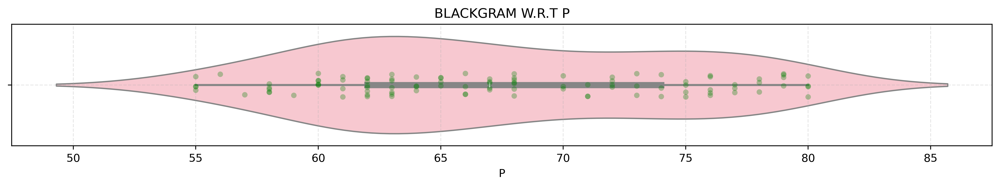

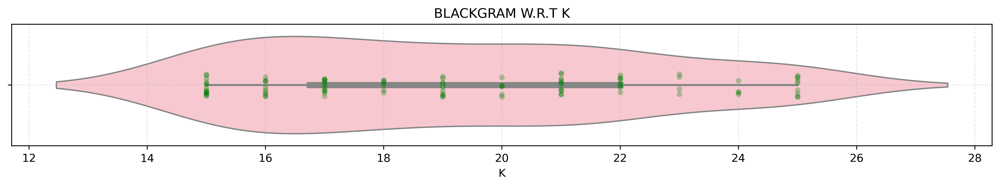

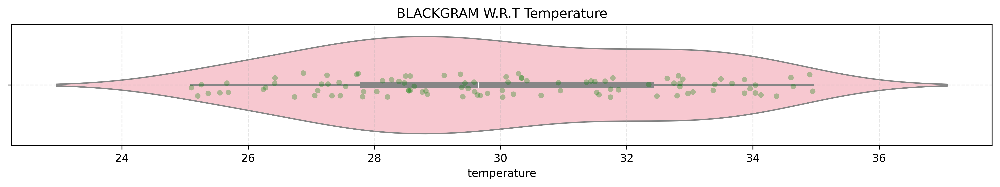

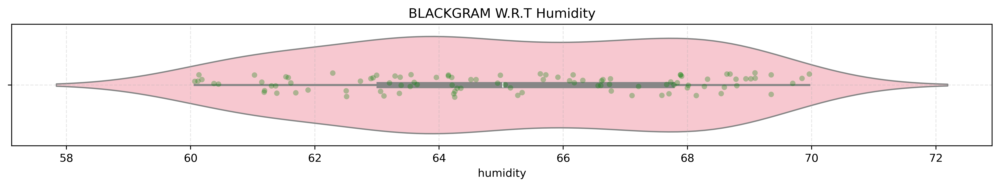

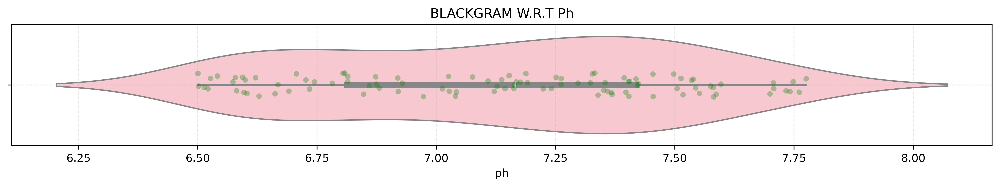

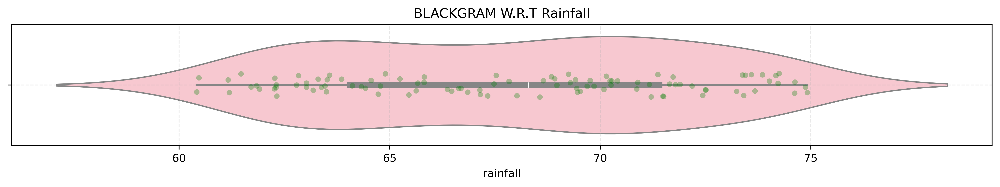

In [28]:
for i in BLACKGRAM.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.violinplot(data=BLACKGRAM,x=i,color="pink")
    sns.stripplot(data=BLACKGRAM,x=i,color="green",alpha=0.3)
    plt.grid(ls='--',alpha=0.3)
    plt.title(f"BLACKGRAM W.R.T {i.capitalize()}")
    plt.show()

### CHICKPEA

In [29]:
Chickpea=data[data["label"]=='chickpea']

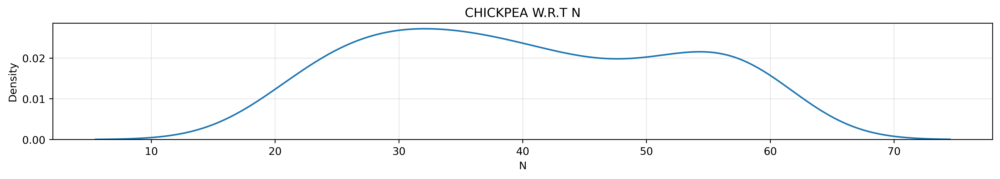

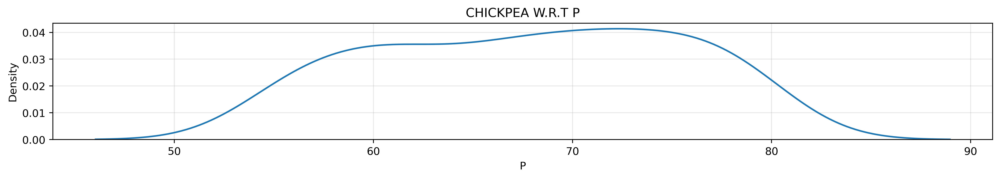

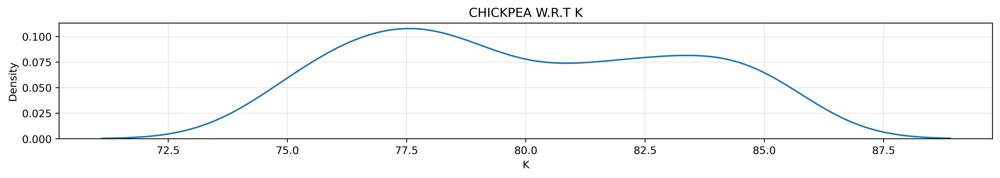

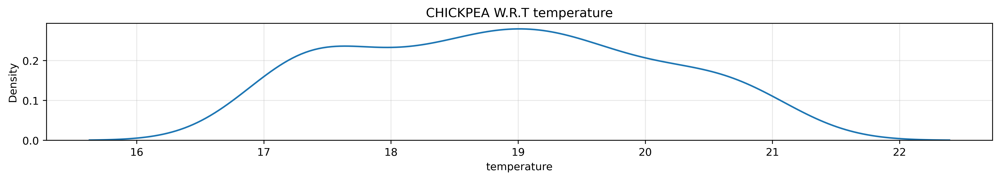

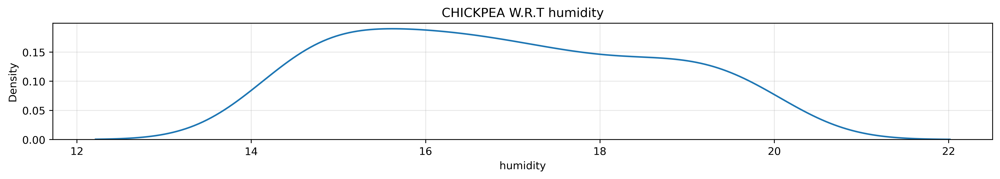

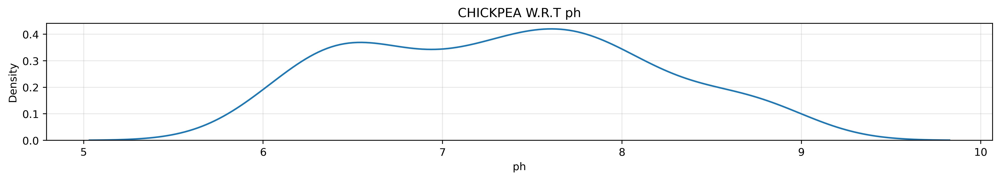

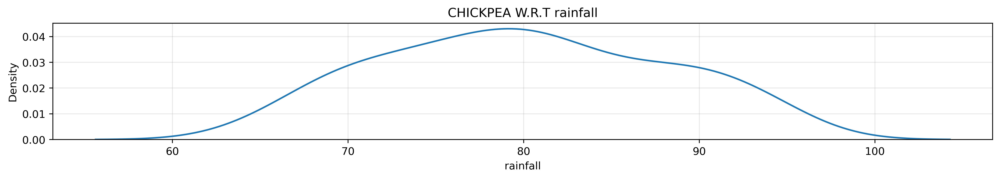

In [30]:
for i in Chickpea.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.kdeplot(data=Chickpea ,x=i)
    plt.grid(alpha=0.3)
    plt.title(f"CHICKPEA W.R.T {i}")
    plt.show()

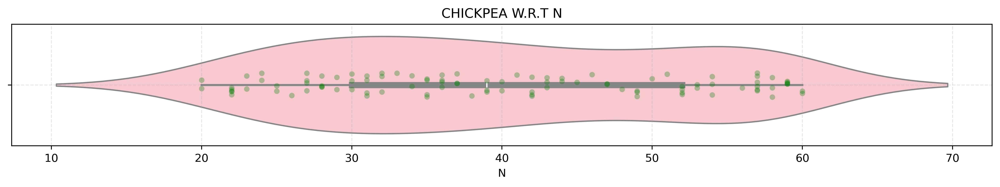

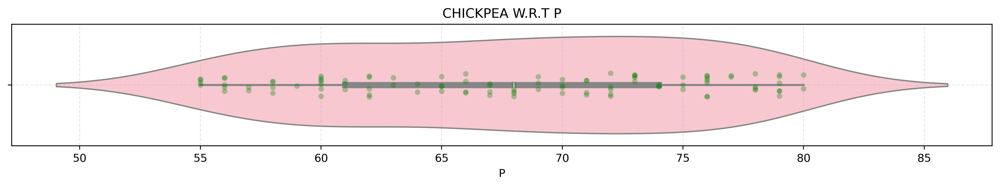

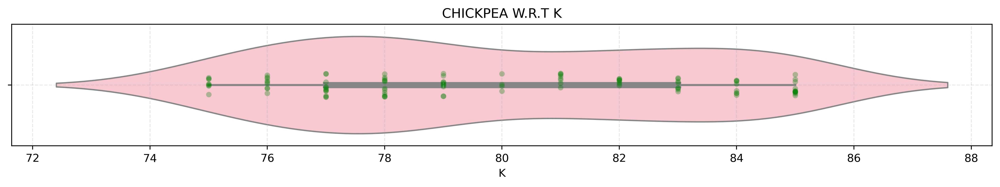

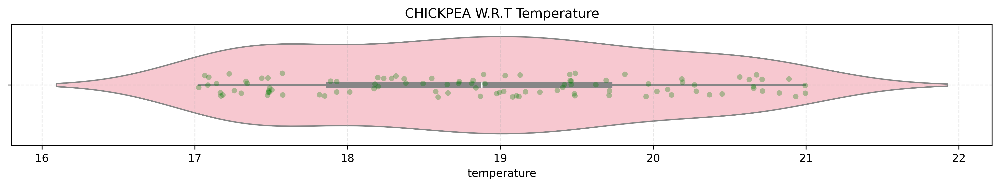

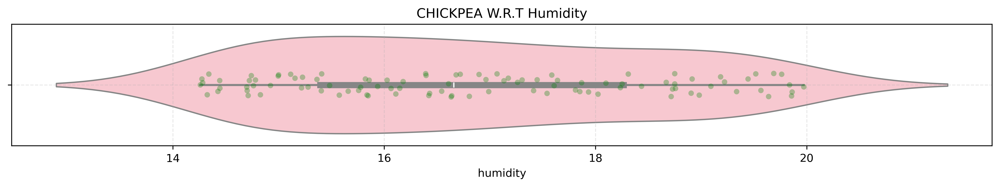

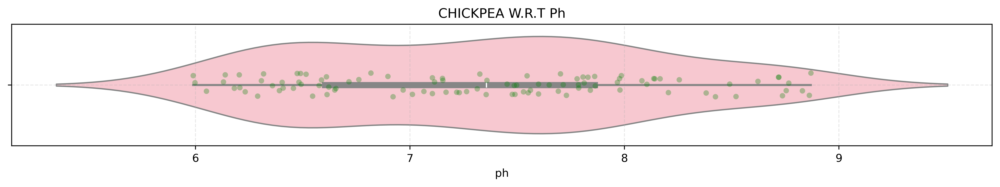

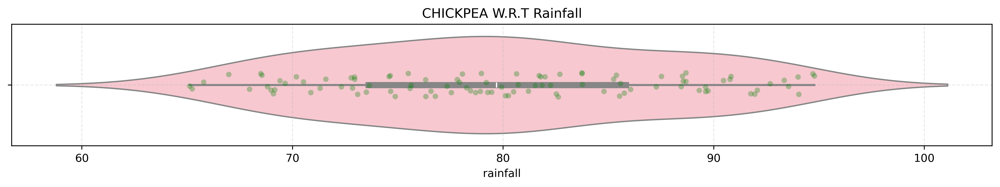

In [31]:
for i in Chickpea.select_dtypes(include=["number"]):
    plt.figure(figsize=(16,2),dpi=400)
    sns.violinplot(data=Chickpea,x=i,color="pink")
    sns.stripplot(data=Chickpea,x=i,color="green",alpha=0.3)
    plt.grid(ls='--',alpha=0.3)
    plt.title(f"CHICKPEA W.R.T {i.capitalize()}")
    plt.show()

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
features=data.drop(["label"],axis=1).copy()
labels=data["label"]

In [34]:
X_train,X_test,y_train,y_test=train_test_split(features,labels,random_state=42,test_size=0.2)

In [35]:
X_train.columns

Index(['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall'], dtype='object')

In [36]:
num_data=['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']


In [46]:
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,make_column_transformer
from sklearn.preprocessing import OneHotEncoder,StandardScaler,FunctionTransformer,OrdinalEncoder
from sklearn.impute import SimpleImputer

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, accuracy_score,roc_curve,roc_auc_score,mean_squared_error,r2_score,f1_score

In [38]:
pipe_num_val=make_pipeline(
    StandardScaler()
)

In [39]:
inner=ColumnTransformer([
    ("Num_val",pipe_num_val,num_data)
])

In [40]:
pipeline=Pipeline([
    ("Pipeline",inner),
    ("model",LogisticRegression())
])
pipeline

Pipeline(steps=[('Pipeline',
                 ColumnTransformer(transformers=[('Num_val',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['N', 'P', 'K', 'temperature',
                                                   'humidity', 'ph',
                                                   'rainfall'])])),
                ('model', LogisticRegression())])

In [41]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('Pipeline',
                 ColumnTransformer(transformers=[('Num_val',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['N', 'P', 'K', 'temperature',
                                                   'humidity', 'ph',
                                                   'rainfall'])])),
                ('model', LogisticRegression())])

In [42]:
y_hat=pipeline.predict(X_test)

In [72]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       0.90      0.95      0.93        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       0.94      1.00      0.97        17
      cotton       0.94      1.00      0.97        17
      grapes       1.00      1.00      1.00        14
        jute       0.83      0.87      0.85        23
 kidneybeans       0.95      0.95      0.95        20
      lentil       0.85      1.00      0.92        11
       maize       1.00      0.95      0.98        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.92      0.96        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       0.96    

In [44]:
precision_score(y_test,y_hat,average='weighted')

0.9644420567548909

In [45]:
recall_score(y_test,y_hat,average='weighted')

0.9636363636363636

In [47]:
f1_score(y_test,y_hat,average='weighted')

0.9635115059268677

In [73]:
def evaluate(model):
    for model_name, model in models.items():
        pipeline=Pipeline([
        ("Pipeline",inner),
        ("model",model())
        ])
        pipeline.fit(X_train,y_train)
        y_hat=pipeline.predict(X_test)
        print(model_name)
        print(classification_report(y_test, y_hat))

In [74]:
models={
    "Random Forest Classifier": RandomForestClassifier,
    "Decision Tree":DecisionTreeClassifier,
    "SGD Classifier":SGDClassifier
}

In [76]:
evaluate(models)

Random Forest Classifier
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       1.00      1.00      1.00        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       1.00      1.00      1.00        17
      cotton       1.00      1.00      1.00        17
      grapes       1.00      1.00      1.00        14
        jute       0.92      1.00      0.96        23
 kidneybeans       1.00      1.00      1.00        20
      lentil       0.92      1.00      0.96        11
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.96      0.98        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
  

## Model Persistence

In [77]:
import joblib

In [78]:
joblib.dump(pipeline,"model.joblib")

['model.joblib']

In [79]:
saved_model=joblib.load("model.joblib")
saved_model

Pipeline(steps=[('Pipeline',
                 ColumnTransformer(transformers=[('Num_val',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['N', 'P', 'K', 'temperature',
                                                   'humidity', 'ph',
                                                   'rainfall'])])),
                ('model', LogisticRegression())])

In [80]:
y_pred=saved_model.predict(X_test)

In [81]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       0.90      0.95      0.93        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       0.94      1.00      0.97        17
      cotton       0.94      1.00      0.97        17
      grapes       1.00      1.00      1.00        14
        jute       0.83      0.87      0.85        23
 kidneybeans       0.95      0.95      0.95        20
      lentil       0.85      1.00      0.92        11
       maize       1.00      0.95      0.98        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.92      0.96        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       0.96    